## Test colmap

In [1]:
import os
import sys
# add your module path
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
# change your base path
# os.chdir('../')
print(os.getcwd())

/home/yoyee/Documents/sem_clam_yyj


In [2]:

%load_ext autoreload
%autoreload 2

In [3]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))


In [4]:
import numpy as np
import matplotlib.pyplot as plt

In [6]:
from colmap_model import read_model
path = '/home/yoyee/Documents/datasets/gerrard-hall/sparse/0/'
data = read_model(path, '.bin')


In [7]:
cameras, images, points3D = data
print("num_cameras:", len(cameras))
print("num_images:", len(images))
print("num_points3D:", len(points3D))

num_cameras: 1
num_images: 100
num_points3D: 43071


In [41]:
print("cameras: ", cameras[1])
print("images: ", images[1])

cameras:  Camera(id=1, model='RADIAL', width=5616, height=3744, params=array([ 3.83804205e+03,  3.83704356e+03,  2.80800000e+03,  1.87200000e+03,
       -1.10186689e-01]))
images:  Image(id=1, qvec=array([ 0.22424949, -0.25325611,  0.6924845 ,  0.63721168]), tvec=array([-0.7212888 , -1.96550077,  2.73604698]), pose=array([[-0.08734688, -0.99610353, -0.0121769 , -0.7212888 ],
       [ 0.76893332, -0.05964524, -0.63654065, -1.96550077],
       [ 0.63333409, -0.06496307,  0.77114702,  2.73604698],
       [ 0.        ,  0.        ,  0.        ,  1.        ]]), camera_id=array(1), name='IMG_2387.JPG', xys=array([[ 758.38574219,   61.36777496],
       [2757.86962891,   11.28521633],
       [2775.62963867,   33.56768417],
       ...,
       [1864.0871582 , 3612.57421875],
       [2398.2121582 , 3603.64233398],
       [2398.2121582 , 3603.64233398]]), point3D_ids=array([-1, -1, -1, ..., -1, -1, -1]))


### Read images

In [35]:
import glob
import imageio
img_dir = '/home/yoyee/Documents/datasets/gerrard-hall/images/'
ext = '*.JPG'
png_image_files = sorted(glob.glob(os.path.join(img_dir, ext)))
# color = [imageio.imread(f) for f in png_image_files]
color = []
count = 0
for f in png_image_files:
    color.append(imageio.imread(f))
    count += 1
    if count > 10: break
print("png_image_files: ", len(color))

png_image_files:  [Array([[[ 12,  11,  16],
        [ 14,  13,  18],
        [ 14,  13,  18],
        ...,
        [ 89, 131, 147],
        [ 89, 124, 143],
        [ 90, 123, 142]],

       [[ 12,  13,  17],
        [ 14,  15,  19],
        [ 14,  15,  19],
        ...,
        [ 60,  91,  93],
        [ 85, 113, 116],
        [ 84, 108, 112]],

       [[ 13,  12,  17],
        [ 15,  14,  19],
        [ 16,  15,  20],
        ...,
        [ 83, 108, 102],
        [107, 130, 124],
        [ 88, 109, 102]],

       ...,

       [[ 39,  40,  42],
        [ 39,  40,  42],
        [ 39,  40,  42],
        ...,
        [ 59,  56,  67],
        [ 58,  55,  66],
        [ 57,  54,  65]],

       [[ 40,  41,  43],
        [ 40,  41,  43],
        [ 40,  41,  45],
        ...,
        [ 60,  57,  68],
        [ 59,  56,  67],
        [ 59,  56,  67]],

       [[ 40,  41,  45],
        [ 39,  40,  44],
        [ 39,  40,  44],
        ...,
        [ 61,  58,  69],
        [ 61,  58,  69],
     

### Check the 3D points generated by COLMAP itself
- Colmap generates the sparse 3d points - project them back into two frames and see if they match up.

In [44]:
f1 = 0
f2 = 4
p1 = images[f1+1].pose
print("p1: ", p1)
p2 = images[f2+1].pose

p1:  [[-0.08734688 -0.99610353 -0.0121769  -0.7212888 ]
 [ 0.76893332 -0.05964524 -0.63654065 -1.96550077]
 [ 0.63333409 -0.06496307  0.77114702  2.73604698]
 [ 0.          0.          0.          1.        ]]


In [17]:
camera = cameras
fx = camera[1].params[0]
fy = camera[1].params[1]
cx = camera[1].params[2]
cy = camera[1].params[3]

K = np.array([[fx, 0.0, cx], 
              [0.0, fy, cy], 
              [0.0,  0.0, 1.0]])

K_inv = np.array([[1/fx, 0.0, -cx/fx], 
                  [0.0, 1/fy, -cy/fy], 
                  [0.0,  0.0, 1.0]])

p1:  [[-0.08734688 -0.99610353 -0.0121769  -0.7212888 ]
 [ 0.76893332 -0.05964524 -0.63654065 -1.96550077]
 [ 0.63333409 -0.06496307  0.77114702  2.73604698]
 [ 0.          0.          0.          1.        ]]


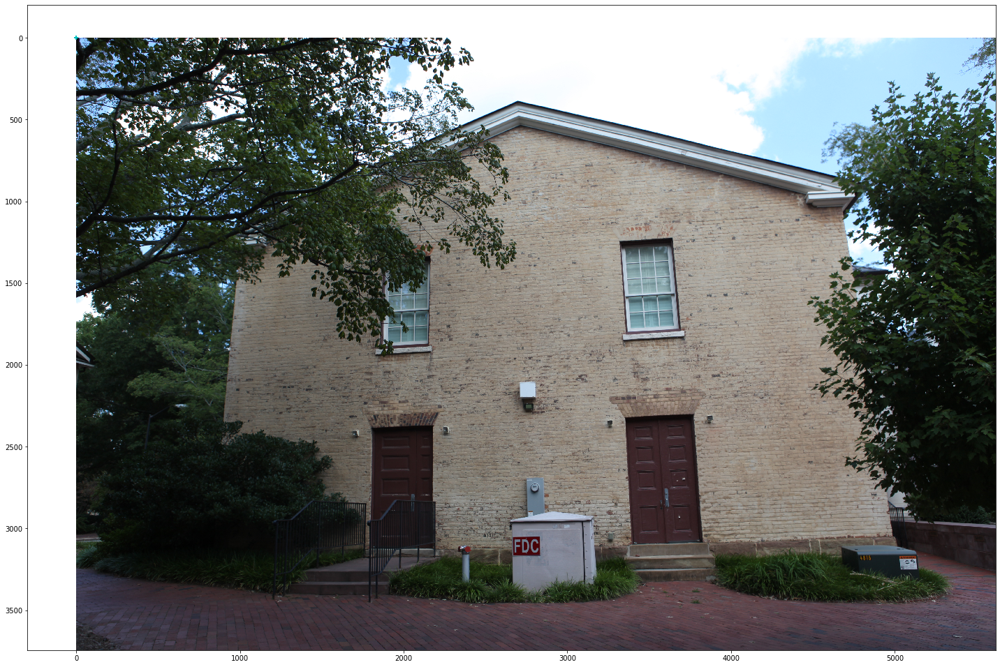

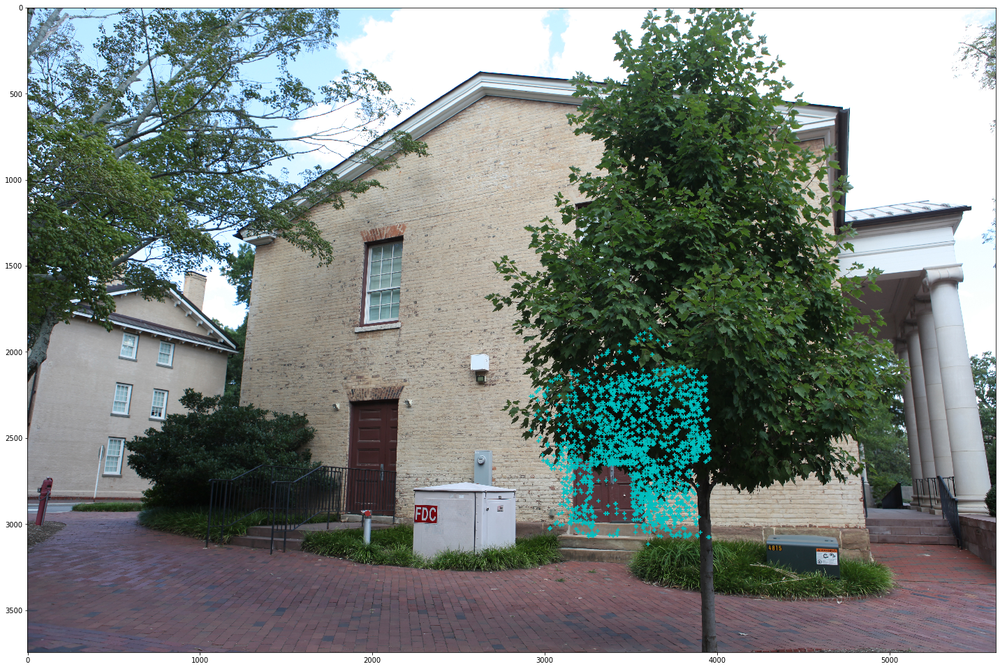

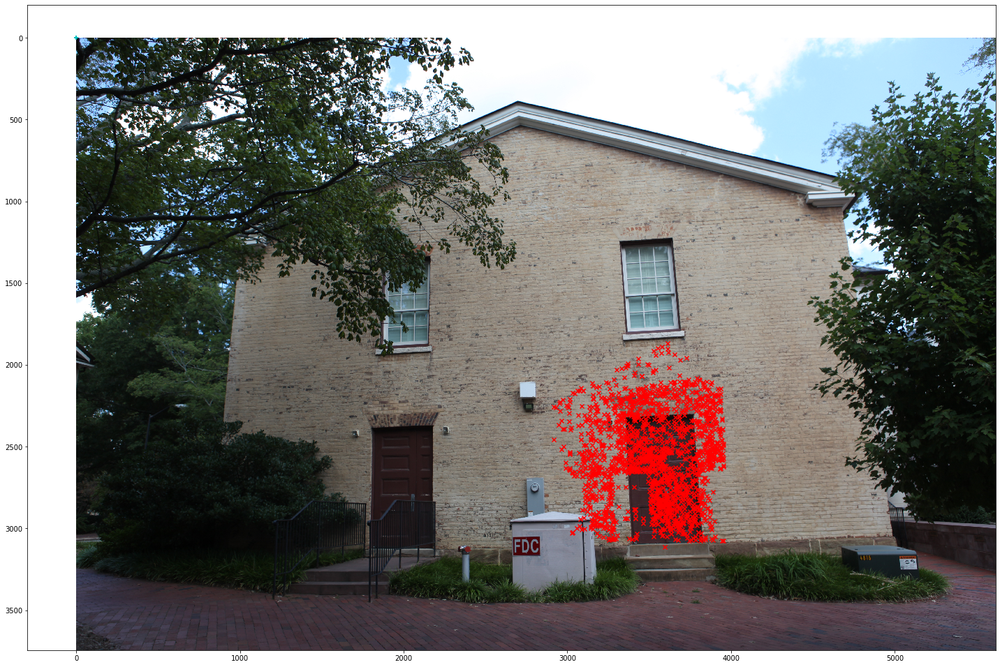

In [43]:
points3d = points3D
from util import toHomogeneous, fromHomogeneous, plot_img
# filter out the 3d points that are not found in this frame AND 
# that are only found within this 50 frames of the initial frame (because that will create outliers)

world = np.array([points3d[p].xyz for p in points3d if f1+1 in points3d[p].image_ids and f1+1+points3d[p].image_ids[0] < 50])

# Tcw_f1 = K @ np.linalg.inv(p1)[:3]
# Tcw_f1 = K @ p1[:3]
Tcw_f1 = p1[:3]
# print("p1: ", p1)
pts1 = np.array([Tcw_f1 @ p for p in toHomogeneous(world)])
pts1 = fromHomogeneous(pts1)
plot_img(color[f1], pts1) 
# print(len(pts1))

Tcw_f2 = K @ p2[:3]
pts2 = np.array([Tcw_f2 @ p for p in toHomogeneous(world)])
pts2 = fromHomogeneous(pts2)
plot_img(color[f2], pts2) 
plot_img(color[f1], pts1, pts2=pts2)